In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import soundfile

%matplotlib inline
%config InlineBackend.figure_format = "retina"


In [2]:
from IPython.display import Audio

# Load and play the audio file
audio_path = 'audio.wav'  
Audio(audio_path)

In [3]:
import torchaudio
audio, sr = torchaudio.load(audio_path)
sr

24000

In [4]:
print(audio.shape)
audio = audio[0]

torch.Size([2, 1784448])


In [5]:
tm = audio.shape[0] / sr
print(f"Audio length: {tm} seconds")

Audio length: 74.352 seconds


In [6]:
audio

tensor([0., 0., 0.,  ..., 0., 0., 0.])

In [7]:
def audio_plot(audio, sr, clr, tl):
    plt.figure(figsize=(15, 4))
    plt.plot(audio, color = clr, alpha = 0.7)
    plt.xticks(np.arange(0, audio.shape[0], sr), np.arange(0, audio.shape[0] / sr, 1))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.title(tl)
    plt.grid()
    plt.show()

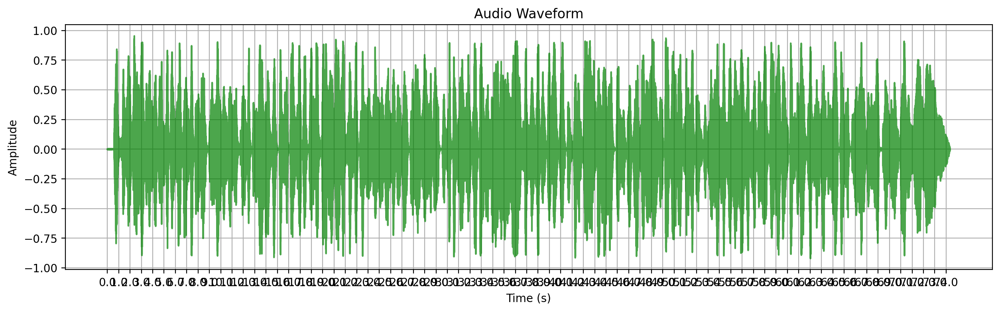

In [8]:
audio_plot(audio, sr, 'green', 'Audio Waveform')

In [9]:
audio = audio[-5 * sr:]
print(audio.shape)
print(audio)
tm = audio.shape[0] / sr
print(f"Audio length: {tm} seconds")

torch.Size([120000])
tensor([-0.0414, -0.0012, -0.0291,  ...,  0.0000,  0.0000,  0.0000])
Audio length: 5.0 seconds


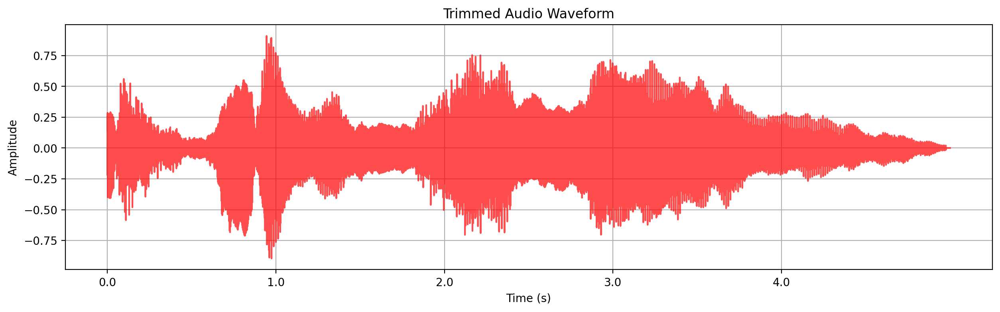

In [10]:
audio_plot(audio, sr, 'red', 'Trimmed Audio Waveform')

In [11]:
X = torch.arange(0, len(audio)).unsqueeze(1).float()
X = X / X.max() * 200 - 100
print(X.shape)
print(X)

torch.Size([120000, 1])
tensor([[-100.0000],
        [ -99.9983],
        [ -99.9967],
        ...,
        [  99.9967],
        [  99.9983],
        [ 100.0000]])


In [12]:
Audio(audio, rate = sr)

In [13]:
from sklearn.kernel_approximation import RBFSampler

def create_rff_features(X, num_features, sigma):
    # Set a random state to the sampler for repoducibility
    rff = RBFSampler(n_components = num_features, gamma = 1 / (2 * sigma**2), random_state = 13)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype = torch.float32)
    

In [14]:
num_features = 10000
sigma = 0.008

X_rff = create_rff_features(X, num_features, sigma)
print(X_rff.shape)
print(X_rff)

torch.Size([120000, 10000])
tensor([[-1.3291e-02, -1.1266e-02,  6.8662e-03,  ...,  1.3997e-02,
         -7.1404e-03, -1.3975e-02],
        [-1.2430e-02, -9.7989e-03,  6.7520e-03,  ...,  1.3505e-02,
         -1.0819e-02, -1.3986e-02],
        [-1.1296e-02, -8.0813e-03,  6.6364e-03,  ...,  1.2687e-02,
         -1.3246e-02, -1.2725e-02],
        ...,
        [ 1.4023e-02, -4.8589e-03,  1.0230e-03,  ...,  1.2994e-02,
          1.3888e-02,  4.2931e-03],
        [ 1.3595e-02, -2.7058e-03,  8.9127e-04,  ...,  1.1953e-02,
          1.3975e-02,  5.3020e-05],
        [ 1.2869e-02, -5.1277e-04,  7.6115e-04,  ...,  1.0631e-02,
          1.2440e-02, -4.1656e-03]])


In [15]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_rff.numpy(), audio)

pred_audio = model.predict(X_rff.numpy())
print(pred_audio.shape)

(120000,)


In [16]:
import joblib
joblib.dump(model, 'model.pkl')
model = joblib.load('model.pkl')

import soundfile as sf
sf.write('pred_audio.wav', pred_audio, sr)

In [17]:
print(pred_audio)
print(audio)

[-0.11820774 -0.11701946 -0.12282543 ... -0.0014265   0.03691884
  0.05071278]
tensor([-0.0414, -0.0012, -0.0291,  ...,  0.0000,  0.0000,  0.0000])


In [18]:
np.linalg.norm(pred_audio - audio.numpy()), np.linalg.norm((pred_audio - audio.numpy()), ord = 1)

(27.901962, 7242.5083)

In [19]:
Audio(pred_audio, rate = sr)

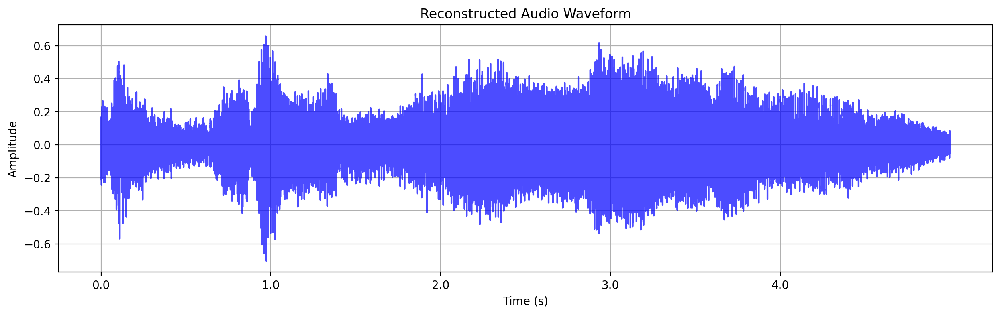

In [20]:
audio_plot(pred_audio, sr, 'blue', 'Reconstructed Audio Waveform')

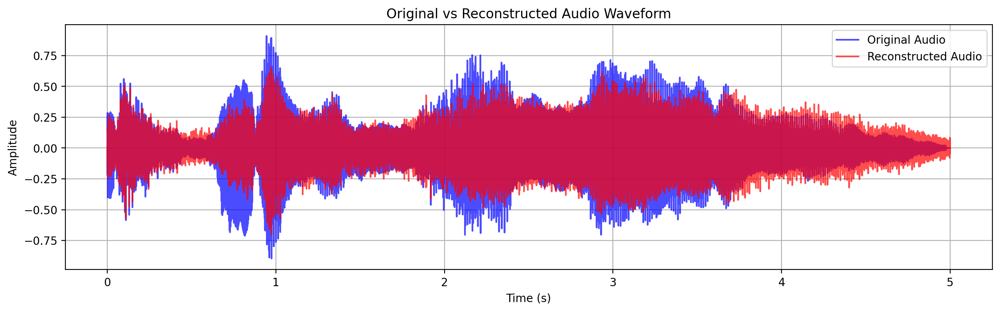

In [29]:
plt.figure(figsize=(15, 4))
time = np.arange(audio.shape[-1]) / sr
plt.plot(time, audio , color = 'blue', alpha = 0.7, label = 'Original Audio')
plt.plot(time, pred_audio ,color = 'red', alpha = 0.7, label = 'Reconstructed Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original vs Reconstructed Audio Waveform')
plt.grid()
plt.legend()
plt.show()

In [22]:
from sklearn.metrics import mean_squared_error
rmse = np.sqrt(mean_squared_error(audio, pred_audio))
print(f"RMSE: {rmse:.4f}")

RMSE: 0.0805


In [30]:
# # Function to calculate Signal-to-Noise Ratio (SNR)
# def snr(original, reconstructed):
#     signal_power = np.mean(original**2)
#     noise_power = np.mean((original - reconstructed)**2)
#     return 10 * np.log10(signal_power / noise_power)

# # Calculate SNR
# snr_value = snr(audio, pred_audio)
# print(f"SNR: {snr_value:.4f} dB")

In [39]:
# Function to compute Random Fourier Features
def rff_transform(X, D=5000, gamma=0.1):
    np.random.seed(42)
    W = np.random.randn(X.shape[1], D) * np.sqrt(2 * gamma)
    b = 2 * np.pi * np.random.rand(D)
    Z = np.sqrt(2 / D) * np.cos(np.dot(X, W) + b)
    return torch.tensor(Z, dtype = torch.float32)

# Reshape time vector and compute RFF
#t = t.reshape(-1, 1)
#Z_t = rff_transform(X, D=500, gamma=0.1)

X_rff_2 = rff_transform(X, 5000, 0.1)
print(X_rff_2.shape)
print(X_rff_2)

torch.Size([120000, 5000])
tensor([[-0.0134,  0.0092,  0.0118,  ..., -0.0179, -0.0171, -0.0160],
        [-0.0134,  0.0092,  0.0118,  ..., -0.0179, -0.0171, -0.0160],
        [-0.0134,  0.0092,  0.0118,  ..., -0.0179, -0.0171, -0.0160],
        ...,
        [-0.0058,  0.0055,  0.0181,  ...,  0.0150,  0.0173, -0.0197],
        [-0.0057,  0.0055,  0.0181,  ...,  0.0151,  0.0173, -0.0197],
        [-0.0057,  0.0055,  0.0181,  ...,  0.0151,  0.0173, -0.0197]])


In [40]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_rff_2.numpy(), audio)

pred_audio = model.predict(X_rff_2.numpy())
print(pred_audio.shape)

(120000,)


In [41]:
import joblib
joblib.dump(model, 'model.pkl')
model = joblib.load('model.pkl')

import soundfile as sf
sf.write('pred_audio.wav', pred_audio, sr)

In [42]:
print(pred_audio)
print(audio)

[-0.0655365  -0.06388855 -0.06358337 ... -0.02455139 -0.02558899
 -0.0247345 ]
tensor([-0.0414, -0.0012, -0.0291,  ...,  0.0000,  0.0000,  0.0000])


In [44]:
np.linalg.norm(pred_audio - audio.numpy()), np.linalg.norm((pred_audio - audio.numpy()), ord = 1)

(62.25001, 16260.893)

In [45]:
Audio(pred_audio, rate = sr)

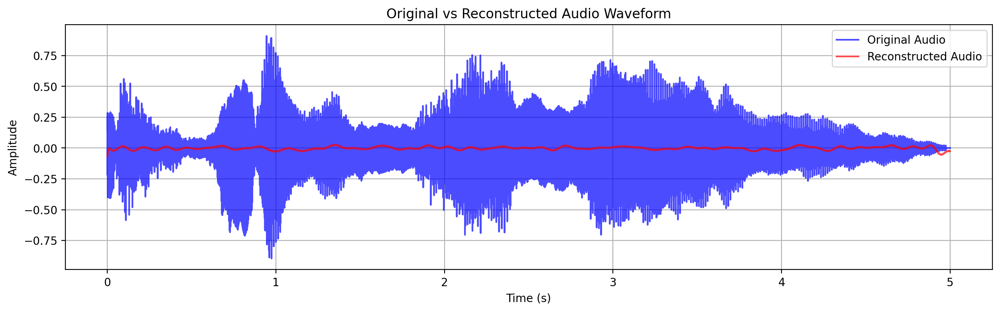

In [46]:
plt.figure(figsize=(15, 4))
time = np.arange(audio.shape[-1]) / sr
plt.plot(time, audio , color = 'blue', alpha = 0.7, label = 'Original Audio')
plt.plot(time, pred_audio ,color = 'red', alpha = 0.7, label = 'Reconstructed Audio')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original vs Reconstructed Audio Waveform')
plt.grid()
plt.legend()
plt.show()

In [47]:
rmse = np.sqrt(mean_squared_error(audio, pred_audio))
print(f"RMSE: {rmse:.4f}")

RMSE: 0.1797
